# Install libraries

In [ ]:
!pip install captum
!pip install transformers[torch]
!pip install datasets
!pip install evaluate
!pip install wandb
!pip install sentencepiece

# Install Cloud Storage FUSE.
!echo "deb https://packages.cloud.google.com/apt gcsfuse-`lsb_release -c -s` main" | sudo tee /etc/apt/sources.list.d/gcsfuse.list
!curl https://packages.cloud.google.com/apt/doc/apt-key.gpg | sudo apt-key add -
!apt -qq update && apt -qq install gcsfuse

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 14.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.7/7.7 MB 50.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 302.0/302.0 kB 32.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.8/3.8 MB 106.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 76.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 258.1/258.1 kB 28.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 295.0/295.0 kB 31.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 493.7/493.7 kB 7.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 115.3/115.3 kB 13.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 18.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.1/84.1 kB 2.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 21.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━

In [ ]:
!pip install transformers-interpret

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.8/45.8 kB 1.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 17.1 MB/s eta 0:00:00


In [ ]:
!pip install --quiet shap==0.39

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 356.2/356.2 kB 5.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done


# Import Libraries

In [ ]:
from datetime import datetime
from dataclasses import dataclass, asdict, field
from typing import Union
from pydantic import BaseModel
import random
import os
import shutil

import numpy as np
import torch
import wandb
from datasets import load_dataset
from torch.nn.utils.rnn import pad_sequence
from torch.utils.data import DataLoader
from tqdm import tqdm
from transformers import (
    AutoModelForSequenceClassification,
    AutoTokenizer,
    DataCollatorWithPadding,
    PreTrainedModel,
    Trainer,
    TrainingArguments,
    set_seed,
    TextClassificationPipeline
)

from captum.attr import IntegratedGradients
from captum.attr import visualization as viz

import shap

import evaluate
import time

import warnings
warnings.simplefilter(action='ignore')
warnings.filterwarnings("ignore")

import logging
logging.disable(logging.WARNING)

import inspect
from google.colab import auth
auth.authenticate_user()

from transformers_interpret import PairwiseSequenceClassificationExplainer


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Mount a Cloud Storage bucket or location, without the gs:// prefix.
mount_path = "x01-coliee_dir"  # or a location like "my-bucket/path/to/mount"
gs_local_path = f"{mount_path}"

!mkdir -p {gs_local_path}
!gcsfuse --implicit-dirs {mount_path} {gs_local_path}

{"time":"24/10/2023 06:24:27.633164","severity":"INFO","msg":"Start gcsfuse/1.2.0 (Go version go1.21.0) for app \"\" using mount point: /content/x01-coliee_dir\n"}


In [ ]:
data_local_path = "drive/MyDrive"
model_local_path = "models"

# Load Data

In [ ]:
# Global Config

feature_dict = {
    "SENTENCE_LENGTH": ['hyp_length'],
    "WORD_OVERLAP": ['overlap', 'is_word_overlap'],
    "HAS_CONTRADICTION_WORDS": ['has_negation'],
    "SUBSEQUENCE_HEURISTICS": ['is_subsequence_heuristic'],
    "ALL": 'all',
    "NONE": "None"
}

models = {
    'BERT_BASE': 'bert-base-uncased',
    'BERT_BASE_MNLI': 'gchhablani/bert-base-cased-finetuned-mnli',
    'ROBERTA_BASE': 'roberta-base',
    'ROBERTA_BASE_MNLI': 'textattack/roberta-base-MNLI',
    'LEGAL_BERT': 'nlpaueb/legal-bert-base-uncased',
    'ELECTRA_BASE_MNLI': 'howey/electra-base-mnli',
    'DEBERTA_BASE_NLI': 'MoritzLaurer/DeBERTa-v3-base-mnli-fever-anli'
}

def get_key_from_value(d, value):
    for key, val in d.items():
        if val == value:
            return key
    return None


MODEL_TYPE="full-context"
dataset_year = '2022'
feature = "NONE"
run_num = 1
chosen_model = models['ROBERTA_BASE_MNLI']
seed = 42


@dataclass
class GlobalConfig:
    features: list = field(default_factory=lambda: feature_dict[feature])
    feat_str = get_key_from_value(feature_dict, feature_dict[feature])
    device: torch.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    train_file: str = f"/content/{data_local_path}/data/task 4/train/coliee_train_{dataset_year}.csv"
    test_file: str = f"/content/{data_local_path}/data/task 4/test/non_adv_coliee_test_{dataset_year}.csv"
    train_split: float = 0.9
    num_labels: int = 2
    seed: int = seed
    model_name: str = chosen_model # CHANGE here for models
    run_name: str = f"X01-run-{dataset_year}-{run_num}-{MODEL_TYPE}-{feat_str}-features"
    max_length: int = 512 if MODEL_TYPE == "full-context" else 180 # Based on the hyp and prem sentence lengths in the dataset # CHANGE the max length here


# Global Configuration
global_config = GlobalConfig()

if global_config.features == 'all':
    num_features = 5
elif global_config.features == 'None':
    num_features = 0
else:
    num_features = len(global_config.features)

if num_features and MODEL_TYPE == "full-context":
    model_dir = "FullContextModelsWithFeatures"
elif num_features and MODEL_TYPE == "hyp-only":
    model_dir = "HypOnlyModelsWithFeatures"
elif not num_features and MODEL_TYPE == "full-context":
    model_dir = "FullContextModels"
elif not num_features and MODEL_TYPE == "hyp-only":
    model_dir = "HypOnlyModels"

model_output_dir = f"/content/{mount_path}/X01-{model_dir}/seed-{global_config.seed}/{global_config.model_name}/{dataset_year}/{global_config.run_name}/"



In [ ]:
import pandas as pd
pd.read_csv(global_config.test_file)

,id,label,premise,hypothesis,labels,hyp_tokens,hyp_length,prem_tokens,prem_length,overlap,is_word_overlap,negations,has_negation,detected_subsequence,is_subsequence_heuristic,percent_overlap,Artefact_type
0,R03-01-E,0,Article 32 (1) Having received proof that a mi...,In the event that a declaration of disappearan...,N,"['in', 'the', 'event', 'that', 'a', 'declarati...",59,"['article', '32', '(', '1', ')', 'having', 're...",135,48,True,[],False,NaN,False,81.355932,Sentence Length Artefact
1,R03-01-I,1,Article 30 (1) If it has been unclear for seve...,When a declaration of disappearance is made on...,Y,"['when', 'a', 'declaration', 'of', 'disappeara...",64,"['article', '30', '(', '1', ')', 'if', 'it', '...",184,61,True,[],False,NaN,False,95.312500,Sentence Length Artefact
2,R03-01-O,0,Article 32 (1) Having received proof that a mi...,"If A, who was subject to a declaration of disa...",N,"['if', 'a', ',', 'who', 'was', 'subject', 'to'...",50,"['article', '32', '(', '1', ')', 'having', 're...",89,23,True,[],False,NaN,False,46.000000,Sentence Length Artefact
3,R03-03-A,1,Article 98-2 Any person may not assert a manif...,A sent a notice of intention to cancel the con...,Y,"['a', 'sent', 'a', 'notice', 'of', 'intention'...",50,"['article', '98-2', 'any', 'person', 'may', 'n...",104,27,True,[],False,NaN,False,54.000000,Sentence Length Artefact
4,R03-08-A,0,Article 201 (1) An action for maintenance of p...,In the case where A has started construction w...,N,"['in', 'the', 'case', 'where', 'a', 'has', 'st...",68,"['article', '201', '(', '1', ')', 'an', 'actio...",146,41,True,[],False,NaN,False,60.294118,Sentence Length Artefact
5,R03-08-O,1,"Article 185 If it is assumed, due to the natur...","When B, who had been in possession of movable ...",Y,"['when', 'b', ',', 'who', 'had', 'been', 'in',...",51,"['article', '185', 'if', 'it', 'is', 'assumed'...",73,22,True,[],False,NaN,False,43.137255,Sentence Length Artefact
6,R03-08-U,1,Article 191 If a possessed thing has been lost...,If A leases movable X owned by B to C without ...,Y,"['if', 'a', 'leases', 'movable', 'x', 'owned',...",58,"['article', '191', 'if', 'a', 'possessed', 'th...",108,33,True,[],False,NaN,False,56.896552,Sentence Length Artefact
7,R03-10-O,1,Article 608 (1) If a lessee has defrayed neces...,In cases where a lessee of a building has exer...,Y,"['in', 'cases', 'where', 'a', 'lessee', 'of', ...",53,"['article', '608', '(', '1', ')', 'if', 'a', '...",189,40,True,[],False,NaN,False,75.471698,Sentence Length Artefact
8,R03-19-A,1,Article 465-10 (1) If the principal obligor re...,Suppose that the individual A guaranteed the o...,Y,"['suppose', 'that', 'the', 'individual', 'a', ...",50,"['article', '465-10', '(', '1', ')', 'if', 'th...",254,35,True,[],False,NaN,False,70.000000,Sentence Length Artefact
9,R03-19-I,0,Article 465-6 (1) A guarantee contract under w...,Suppose that the individual A guaranteed the o...,N,"['suppose', 'that', 'the', 'individual', 'a', ...",58,"['article', '465-6', '(', '1', ')', 'a', 'guar...",747,49,True,[],False,NaN,False,84.482759,Sentence Length Artefact


In [ ]:
# Data prep
file_dict = {
    # "train" : global_config.train_file,
    "test" : global_config.test_file,
}

dataset = load_dataset(
    'csv',
    data_files=file_dict,
    delimiter=',',
    column_names=['id', 'label', 'premise', 'hypothesis', 'labels', 'hyp_tokens','hyp_length', 'prem_tokens', 'prem_length', 'overlap', 'is_word_overlap', 'negations', 'has_negation', 'detected_subsequence', 'is_subsequence_heuristic',"percent_overlap", "Artefact_Type"],
    skiprows=1
)

dataset = dataset.remove_columns('detected_subsequence')


# view dataset
print(dataset)
# print(dataset['train'][0])

# Tokenizer
tokenizer = AutoTokenizer.from_pretrained(global_config.model_name, use_fast=False)

# Custom dataset
class CustomDataset(torch.utils.data.Dataset):
    def __init__(self, dataset, selected_features="None"):
        self.dataset = dataset
        self.selected_features = selected_features

    def __len__(self):
        return len(self.dataset)

    def extract_features(self, item):
        all_features = {
            'hyp_length': item['hyp_length'],
            'is_word_overlap': item['is_word_overlap'],
            'overlap': item['overlap'],
            'has_negations': item['has_negation'],
            'is_subsequence_heuristic': item['is_subsequence_heuristic']
        }

        if self.selected_features == "all":
            extracted_features = all_features
        elif self.selected_features == "None":
            extracted_features = {}
        else:
            extracted_features = {k: all_features[k] for k in self.selected_features if k in all_features}

        return extracted_features

    def __getitem__(self, idx):
        item = dict(self.dataset[idx])

        extracted_features = self.extract_features(item)

        prem_sentence = item['premise']
        hyp_sentence = item['hypothesis']
        if extracted_features:
            for key, values in extracted_features.items():
                hyp_sentence += "[SEP]" + str(values)

        # Tokenization
        inputs = tokenizer(prem_sentence, hyp_sentence, return_tensors="pt", padding='max_length', truncation='longest_first', max_length=global_config.max_length, add_special_tokens=True)
        item['input_ids'] = inputs['input_ids']
        item['attention_mask'] = inputs['attention_mask']
        item['hypothesis_mod'] = hyp_sentence

        return item

# Custom hyp only dataset
class CustomHypOnlyDataset(CustomDataset):
    def __getitem__(self, idx):
        item = dict(self.dataset[idx])

        extracted_features = self.extract_features(item)

        hyp_sentence = item['hypothesis']

        if extracted_features:
            for key, values in extracted_features.items():
                hyp_sentence += "[SEP]" + str(values)

        # Tokenization - Only tokenize the 'hypothesis'
        inputs = tokenizer(hyp_sentence, return_tensors="pt", padding='max_length', truncation=True, max_length=global_config.max_length, add_special_tokens=True)
        item['input_ids'] = inputs['input_ids']
        item['attention_mask'] = inputs['attention_mask']
        item['hypothesis_mod'] = hyp_sentence

        return item



# Create datasets
# Determine the split indices
# num_train = int(global_config.train_split * len(dataset['train']))
# num_eval = len(dataset['train']) - num_train

# # Split the dataset
# train_datasets = dataset['train'].select(range(num_train))
# eval_datasets = dataset['train'].select(range(num_train, num_train + num_eval))
test_datasets = dataset['test']

if MODEL_TYPE == "full-context":
    print("Entering Full Context Data prep")
    # train_data = CustomDataset(train_datasets, selected_features=global_config.features)
    # eval_data = CustomDataset(eval_datasets, selected_features=global_config.features)
    test_data = CustomDataset(test_datasets, selected_features=global_config.features)
    print("Done")
elif MODEL_TYPE == "hyp-only":
    print("Entering Hyp Only Data prep")
    # train_data = CustomHypOnlyDataset(train_datasets, selected_features=global_config.features)
    # eval_data = CustomHypOnlyDataset(eval_datasets, selected_features=global_config.features)
    test_data = CustomHypOnlyDataset(test_datasets, selected_features=global_config.features)
    print("Done")

DatasetDict({
    test: Dataset({
        features: ['id', 'label', 'premise', 'hypothesis', 'labels', 'hyp_tokens', 'hyp_length', 'prem_tokens', 'prem_length', 'overlap', 'is_word_overlap', 'negations', 'has_negation', 'is_subsequence_heuristic', 'percent_overlap', 'Artefact_Type'],
        num_rows: 52
    })
})


Entering Full Context Data prep
Done


In [ ]:
# Initialize the model
def load_model(model_path):
    model = AutoModelForSequenceClassification.from_pretrained(model_path, num_labels=global_config.num_labels, ignore_mismatched_sizes=True).to(global_config.device)
    model.eval()
    print("Model Architecture")
    print(model)
    return model

In [ ]:
model_path = [os.path.join(model_output_dir, folder) for folder in os.listdir(model_output_dir) if folder.startswith('checkpoint')]
model_path

model = load_model(model_path[0])

Model Architecture
RobertaForSequenceClassification(
  (roberta): RobertaModel(
    (embeddings): RobertaEmbeddings(
      (word_embeddings): Embedding(50265, 768, padding_idx=1)
      (position_embeddings): Embedding(514, 768, padding_idx=1)
      (token_type_embeddings): Embedding(1, 768)
      (LayerNorm): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (encoder): RobertaEncoder(
      (layer): ModuleList(
        (0-11): 12 x RobertaLayer(
          (attention): RobertaAttention(
            (self): RobertaSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=True)
              (key): Linear(in_features=768, out_features=768, bias=True)
              (value): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.1, inplace=False)
            )
            (output): RobertaSelfOutput(
              (dense): Linear(in_features=768, out_features=768, bias=

In [ ]:
test_data[9]

{'id': 'R03-19-I',
 'label': 0,
 'premise': 'Article 465-6 (1) A guarantee contract under which the principal obligation is a loan obligation assumed for business or a contract for a revolving guarantee under which the scope of the principal obligation includes a loan obligation assumed for business does not become effective unless the person that will become a guarantor manifests, prior to the conclusion of the contract, the intention to perform the guarantee obligation by means of a notarial instrument prepared within one month prior to the day of conclusion of the contract.\n(2) The notarial instrument referred to in the preceding paragraph must be prepared in compliance with the following formalities:\n(i) the person that will become a guarantor gives the notary oral instructions regarding the particulars specified in (a) or (b) below for the category of contract set forth therein:\n(a) a guarantee contract (excluding the one set forth in (b)): the obligee and obligor of the princi

In [ ]:
i = 10
tt = tokenizer(test_data[i]['premise'], test_data[0]['hypothesis_mod'])
tokens = tokenizer.convert_ids_to_tokens(tt['input_ids'])

In [ ]:
t = tokenizer.encode(text, padding='max_length', truncation=True, max_length=global_config.max_length, add_special_tokens=True, return_tensors='pt')
tokens = tokenizer.convert_ids_to_tokens(t[0])

In [ ]:
ttt = tokenizer.decode(test_data[0]['input_ids'][0])

In [ ]:
ttt

"<s>Article 32 (1) Having received proof that a missing person is alive or that a missing person died at a time different from the time set forth in the preceding Article, the family court, at the request of the missing person or an interested person, must rescind the declaration of that person's disappearance. In this case, the rescission does not affect the validity of any act performed in good faith after the declaration of disappearance but before the rescission thereof.\n(2) A person who has acquired property due to a declaration of disappearance loses the rights in question due to its rescission; provided, however, that the person has the obligation to return that property only to the extent currently enriched.</s></s>In the event that a declaration of disappearance is rescinded, a person who has acquired property due to the declaration of disappearance must return to the missing person the full amount of the benefits received from the acquisition of the property, even if the per

In [ ]:
tet = ttt.replace("<s>", "")
tet = tet.replace("<pad>", "")
tet = re.sub(r"\</s>\s*$", "", tet)

tet

"Article 32 (1) Having received proof that a missing person is alive or that a missing person died at a time different from the time set forth in the preceding Article, the family court, at the request of the missing person or an interested person, must rescind the declaration of that person's disappearance. In this case, the rescission does not affect the validity of any act performed in good faith after the declaration of disappearance but before the rescission thereof.\n(2) A person who has acquired property due to a declaration of disappearance loses the rights in question due to its rescission; provided, however, that the person has the obligation to return that property only to the extent currently enriched.</s></s>In the event that a declaration of disappearance is rescinded, a person who has acquired property due to the declaration of disappearance must return to the missing person the full amount of the benefits received from the acquisition of the property, even if the person

In [ ]:
te = ttt.replace("[CLS]", "")
te = te.replace("[PAD]", "")

te

" Article 32 ( 1 ) Having received proof that a missing person is alive or that a missing person died at a time different from the time set forth in the preceding Article, the family court, at the request of the missing person or an interested person, must rescind the declaration of that person's disappearance. In this case, the rescission does not affect the validity of any act performed in good faith after the declaration of disappearance but before the rescission thereof. ( 2 ) A person who has acquired property due to a declaration of disappearance loses the rights in question due to its rescission ; provided, however, that the person has the obligation to return that property only to the extent currently enriched. [SEP] In the event that a declaration of disappearance is rescinded, a person who has acquired property due to the declaration of disappearance must return to the missing person the full amount of the benefits received from the acquisition of the property, even if the pe

In [ ]:
import re

xe = re.sub(r"\[SEP\]\s*$", "", te)
xe

" Article 32 ( 1 ) Having received proof that a missing person is alive or that a missing person died at a time different from the time set forth in the preceding Article, the family court, at the request of the missing person or an interested person, must rescind the declaration of that person's disappearance. In this case, the rescission does not affect the validity of any act performed in good faith after the declaration of disappearance but before the rescission thereof. ( 2 ) A person who has acquired property due to a declaration of disappearance loses the rights in question due to its rescission ; provided, however, that the person has the obligation to return that property only to the extent currently enriched. [SEP] In the event that a declaration of disappearance is rescinded, a person who has acquired property due to the declaration of disappearance must return to the missing person the full amount of the benefits received from the acquisition of the property, even if the pe

In [ ]:
type(t['input_ids'])

list

In [ ]:
len(tokens)

941

In [ ]:
i = 10
text = test_data[i]['premise']+"[SEP]"+test_data[0]['hypothesis_mod']
text

'Article 472 (1) A new obligor resulting from the assumption of obligation releasing an old obligor assumes an obligation of the same content as the obligation of the initial obligor to the obligee, and the initial obligor is released from their own obligation.\n(2) The assumption of obligation releasing an old obligor may be effected by a contract between the obligee and the person that becomes the replacing obligor. In such a case, the assumption of obligation releasing an old obligor becomes effective when the obligee notifies the initial obligor of the conclusion of that contract.\n(3) The assumption of obligation releasing an old obligor may also be effected if the initial obligor and the person that becomes the replacing obligor conclude a contract and the obligee gives consent to the person that becomes the replacing obligor.[SEP]In the event that a declaration of disappearance is rescinded, a person who has acquired property due to the declaration of disappearance must return t

In [ ]:
text

'Article 465-6 (1) A guarantee contract under which the principal obligation is a loan obligation assumed for business or a contract for a revolving guarantee under which the scope of the principal obligation includes a loan obligation assumed for business does not become effective unless the person that will become a guarantor manifests, prior to the conclusion of the contract, the intention to perform the guarantee obligation by means of a notarial instrument prepared within one month prior to the day of conclusion of the contract.\n(2) The notarial instrument referred to in the preceding paragraph must be prepared in compliance with the following formalities:\n(i) the person that will become a guarantor gives the notary oral instructions regarding the particulars specified in (a) or (b) below for the category of contract set forth therein:\n(a) a guarantee contract (excluding the one set forth in (b)): the obligee and obligor of the principal obligation, the principal of the princip

In [ ]:
test_data[0]['input_ids'][0]

tensor([  101,  8554,  2724,   113,   122,   114,  5823,  1460,  6777,  1115,
          170,  3764,  1825,  1110,  3534,  1137,  1115,   170,  3764,  1825,
         1452,  1120,   170,  1159,  1472,  1121,  1103,  1159,  1383,  5275,
         1107,  1103, 11139,  8554,   117,  1103,  1266,  2175,   117,  1120,
         1103,  4566,  1104,  1103,  3764,  1825,  1137,  1126,  3888,  1825,
          117,  1538,  1231,  1116, 16430,  1181,  1103, 11156,  1104,  1115,
         1825,   112,   188, 14158,   119,  1130,  1142,  1692,   117,  1103,
         1231,  1116, 21349,  8427,  1674,  1136,  6975,  1103, 17782,  1104,
         1251,  2496,  1982,  1107,  1363,  5228,  1170,  1103, 11156,  1104,
        14158,  1133,  1196,  1103,  1231,  1116, 21349,  8427, 24234,   119,
          113,   123,   114,   138,  1825,  1150,  1144,  2888,  2400,  1496,
         1106,   170, 11156,  1104, 14158, 12667,  1103,  2266,  1107,  2304,
         1496,  1106,  1157,  1231,  1116, 21349,  8427,   132, 

In [ ]:
test_data[:2]

19

In [ ]:
cls_explainer = SequenceClassificationExplainer(
        model,
        tokenizer)

In [ ]:
class CustomSequenceClassificationExplainer(SequenceClassificationExplainer):
    def __init__(
        self,
        model: PreTrainedModel,
        tokenizer,
        attribution_type: str = "lig",
        custom_labels = None,
    ):
        super().__init__(model, tokenizer)

    def encode(self, text: str = None) -> list:
        return self.tokenizer.encode(text, add_special_tokens=False, max_length=512, truncation=True)


In [ ]:
custom_cls_explainer = CustomSequenceClassificationExplainer(
        model,
        tokenizer)

In [ ]:
from transformers_interpret import PairwiseSequenceClassificationExplainer

In [ ]:
pairwise_explainer = PairwiseSequenceClassificationExplainer(model, tokenizer)

In [ ]:
str(test_data[i]['hypothesis_mod'])

'In the event that a declaration of disappearance is rescinded, a person who has acquired property due to the declaration of disappearance must return to the missing person the full amount of the benefits received from the acquisition of the property, even if the person acted in good faith regarding the survival of the missing person.'

In [ ]:
len(test_data[9]['input_ids'][0])

512

In [ ]:
# for i in range(10):
# try:
    # text = test_data[i]['premise']+"[SEP]"+test_data[i]['hypothesis_mod']
htmls = []
for i in range(2):
    org_text = tokenizer.decode(test_data[i]['input_ids'][0])
    if global_config.model_name != 'textattack/roberta-base-MNLI':
        text = org_text.replace("[CLS]", "")
        text = text.replace("[PAD]", "")
        text = re.sub(r"\[SEP\]\s*$", "", text)
    else:
        text = org_text.replace("<s>", "")
        text = text.replace("<pad>", "")
        text = re.sub(r"\</s>\s*$", "", text)

    print(text)
    word_attributions =  custom_cls_explainer(text, internal_batch_size=3, n_steps=1000)
    print(f"Predicted Class : {custom_cls_explainer.predicted_class_index} True Class : {test_data[i]['label']}")

    html = custom_cls_explainer.visualize(true_class=str(test_data[i]['label']))
    htmls.append(html)







# IPython.display.display_html(custom_cls_explainer.visualize(f"{chosen_model.split('/')[-1]}_{global_config.feat_str}_vis_instance_{i}.png", true_class=str(test_data[i]['label'])))
# except Exception as e:
#     print(f"Error {i}")
#     print(e)


Article 32 (1) Having received proof that a missing person is alive or that a missing person died at a time different from the time set forth in the preceding Article, the family court, at the request of the missing person or an interested person, must rescind the declaration of that person's disappearance. In this case, the rescission does not affect the validity of any act performed in good faith after the declaration of disappearance but before the rescission thereof.
(2) A person who has acquired property due to a declaration of disappearance loses the rights in question due to its rescission; provided, however, that the person has the obligation to return that property only to the extent currently enriched.</s></s>In the event that a declaration of disappearance is rescinded, a person who has acquired property due to the declaration of disappearance must return to the missing person the full amount of the benefits received from the acquisition of the property, even if the person a

Article 30 (1) If it has been unclear for seven years whether an absentee is dead or alive, the family court may enter a declaration of disappearance at the request of an interested person.
(2) The provisions of the preceding paragraph also apply if it has been unclear whether a person who has entered a war zone, was aboard a vessel that has sunk, or was otherwise exposed to a danger likely to result in a person's death is dead or alive, for one year after the war has ended, the vessel sank, or such other danger has passed.
Article 31 A person subject to a declaration of disappearance pursuant to the provisions of paragraph (1) of the preceding Article is deemed to have died when the period of time referred to in that paragraph ended, and a person subject to a declaration of disappearance pursuant to the provisions of paragraph (2) of that Article is deemed to have died when that danger had passed.</s></s>When a declaration of disappearance is made on the grounds that it has been uncle

In [ ]:
file_html = '''<!DOCTYPE html>
<html>
<body>'''

for htm in htmls:
    file_html += str(htm.data)

file_html += '''</body>
</html>'''

from IPython.core.display import HTML

html_obj = HTML(file_html)

# IPython.display.display_html(file_html)

display(html_obj)

In [ ]:
from transformers_interpret import SequenceClassificationExplainer
import IPython

visuals_folder_path = f"{model_output_dir}/visuals/"

# i = 10

for i in range(len(test_data[:10])):
    # original_text = test_data[i]['premise']+"[SEP]"+test_data[0]['hypothesis_mod']
    text = tokenizer.decode(test_data[i]['input_ids'][0])
    cls_explainer = SequenceClassificationExplainer(
        model,
        tokenizer)
    word_attributions = cls_explainer(text, internal_batch_size=3, n_steps=700)
    print(f"Predicted Class : {cls_explainer.predicted_class_index} True Class : {test_data[i]['label']}")
    # cls_explainer.visualize(f"{visuals_folder_path}{global_config.run_name}_vis_{test_data[i]['id']}.png", true_class=str(test_data[i]['label']))

    IPython.display.display_html(cls_explainer.visualize(f"{chosen_model.split('/')[-1]}_{global_config.feat_str}_vis_instance_{i}.html", true_class=str(test_data[i]['label'])))

ValueError: ignored

In [ ]:
all_features = {
                'hyp_length': 1,
                'is_word_overlap': 2,
                'overlap': 3,
                'has_negations':4,
                'is_subsequence_heuristic': 5
            }

for k,v in all_features.items():
    print(k)

hyp_length
is_word_overlap
overlap
has_negations
is_subsequence_heuristic


## SHAP

In [ ]:
ts = []
for k in range(len(test_data)):
    t = test_data[i]['premise']+"[SEP]"+test_data[0]['hypothesis_mod']
    ts.append(t)

In [ ]:
i = 10
text = test_data[i]['premise']+"[SEP]"+test_data[0]['hypothesis_mod']
text

'Article 98 (1) A manifestation of intention may be made by means of public notice if the person making it is unable to ascertain who the other party is or is unable to ascertain the whereabouts thereof.\n(2) Public notice as referred to in the preceding paragraph is effected by a notice being posted in the posting area of the relevant court and an indication that that posting has been made being published in the Official Gazette at least once, in accordance with the provisions of the Code of Civil Procedure (Act No. 109 of 1996) on service by publication; provided, however, that if the court finds it to be suitable, it may order that a notice be posted in the posting area of the city office, ward office, town hall, or any facility equivalent to these in lieu of the relevant information being published in the Official Gazette.\n(3) A manifestation of intention by public notice is deemed to have reached the other party once two weeks have passed since the day when the relevant informati

In [ ]:
def score_and_visualize(text):
  prediction = pipe([text])
  print(prediction[0])

  explainer = shap.Explainer(pipe)
  shap_values = explainer([text])

  return shap_values

In [ ]:
pipe = TextClassificationPipeline(model=model, tokenizer=tokenizer, return_all_scores=True)


In [ ]:
prediction = pipe(ts[:15])
print(prediction[0])

explainer = shap.Explainer(pipe)
shap_values = explainer(ts[:15])

[{'label': 'LABEL_0', 'score': 0.9969557523727417}, {'label': 'LABEL_1', 'score': 0.003044233424589038}]


  0%|          | 0/48 [00:00<?, ?it/s]

Partition explainer:   7%|▋         | 1/15 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

Partition explainer:  20%|██        | 3/15 [01:16<03:48, 19.06s/it]

  0%|          | 0/48 [00:00<?, ?it/s]

Partition explainer:  27%|██▋       | 4/15 [01:59<05:18, 28.96s/it]

  0%|          | 0/48 [00:00<?, ?it/s]

Partition explainer:  33%|███▎      | 5/15 [02:37<05:24, 32.47s/it]

  0%|          | 0/48 [00:00<?, ?it/s]

Partition explainer:  40%|████      | 6/15 [03:15<05:09, 34.40s/it]

  0%|          | 0/48 [00:00<?, ?it/s]

Partition explainer:  47%|████▋     | 7/15 [03:53<04:45, 35.66s/it]

  0%|          | 0/48 [00:00<?, ?it/s]

Partition explainer:  53%|█████▎    | 8/15 [04:31<04:15, 36.43s/it]

  0%|          | 0/48 [00:00<?, ?it/s]

Partition explainer:  60%|██████    | 9/15 [05:10<03:42, 37.05s/it]

  0%|          | 0/48 [00:00<?, ?it/s]

Partition explainer:  67%|██████▋   | 10/15 [05:48<03:06, 37.33s/it]

  0%|          | 0/48 [00:00<?, ?it/s]

Partition explainer:  73%|███████▎  | 11/15 [06:26<02:30, 37.70s/it]

  0%|          | 0/48 [00:00<?, ?it/s]

Partition explainer:  80%|████████  | 12/15 [07:06<01:54, 38.20s/it]

  0%|          | 0/48 [00:00<?, ?it/s]

Partition explainer:  87%|████████▋ | 13/15 [07:43<01:16, 38.09s/it]

  0%|          | 0/48 [00:00<?, ?it/s]

Partition explainer:  93%|█████████▎| 14/15 [08:22<00:38, 38.21s/it]

  0%|          | 0/48 [00:00<?, ?it/s]

Partition explainer: 100%|██████████| 15/15 [09:00<00:00, 38.15s/it]

  0%|          | 0/48 [00:00<?, ?it/s]

Partition explainer: 16it [09:38, 38.59s/it]


In [ ]:
# shap_values = score_and_visualize(text)

shap.plots.text(shap_values)

,,"Article 98 ( 1 ) A manifestation of intention may be made by means of public notice if the person making it is unable to ascertain who the other party is or is unable to ascertain the whereabouts thereof . ( 2 ) Public notice as referred to in the preceding paragraph is effected by a notice being posted in the posting area of the relevant court and an indication that that posting has been made being published in the Official Gazette at least once , in accordance with the provisions of the Code of Civil Procedure ( Act No . 109 of 1996 ) on service by publication ; provided , however , that if the court finds it to be suitable , it may order that a notice be posted in the posting area of the city office , ward office , town hall , or any facility equivalent to these in lieu of the relevant information being published in the Official Gazette .","( 3 ) A manifestation of intention by public notice is deemed to have reached the other party once two weeks have passed since the day when the relevant information was last published in the Official Gazette or once two weeks have passed since the day on which the relevant information started to be posted in lieu of being so published ; provided , however ,","that the effect of a manifestation of intention having reached the other party does not arise if the person making it was negligent in not ascertaining the other party or the whereabouts thereof . ( 4 ) If the person making a manifestation of intention is unable to ascertain who the other party is ,","the procedures involved in public notice are under the jurisdiction of the summary court that has jurisdiction over the locality where the person making the manifestation of intention is domiciled ; if the person making a manifestation of intention is unable to ascertain the whereabouts of the other party ,",the procedures involved in public notice are under the jurisdiction of the summary court that has jurisdiction over the locality of the last known domicile of the other party . ( 5 ) The court must have the person making a manifestation of intention prepay the expenses associated with a public notice .,[SEP],"In the event that a declaration of disappearance is rescinded , a person who has acquired property due to the declaration of disappearance must return to the missing person the full amount of the benefits received from the acquisition of the property ,",even if the person acted in good faith regarding the survival of the missing person .,[SEP] 59 [SEP] True [SEP] 48 [SEP],False [SEP] False
LABEL_0,0.0,-0.935,0.868,1.205,0.567,2.565,0.006,2.993,0.956,0.954,-0.158
LABEL_1,-0.0,0.935,-0.868,-1.205,-0.567,-2.565,-0.006,-2.993,-0.956,-0.954,0.158


,,"Article 98 ( 1 ) A manifestation of intention may be made by means of public notice if the person making it is unable to ascertain who the other party is or is unable to ascertain the whereabouts thereof . ( 2 ) Public notice as referred to in the preceding paragraph is effected by a notice being posted in the posting area of the relevant court and an indication that that posting has been made being published in the Official Gazette at least once , in accordance with the provisions of the Code of Civil Procedure ( Act No . 109 of 1996 ) on service by publication ; provided , however , that if the court finds it to be suitable , it may order that a notice be posted in the posting area of the city office , ward office , town hall , or any facility equivalent to these in lieu of the relevant information being published in the Official Gazette .","( 3 ) A manifestation of intention by public notice is deemed to have reached the other party once two weeks have passed since the day when the relevant information was last published in the Official Gazette or once two weeks have passed since the day on which the relevant information started to be posted in lieu of being so published ; provided , however ,","that the effect of a manifestation of intention having reached the other party does not arise if the person making it was negligent in not ascertaining the other party or the whereabouts thereof . ( 4 ) If the person making a manifestation of intention is unable to ascertain who the other party is ,","the procedures involved in public notice are under the jurisdiction of the summary court that has jurisdiction over the locality where the person making the manifestation of intention is domiciled ; if the person making a manifestation of intention is unable to ascertain the whereabouts of the other party ,",the procedures involved in public notice are under the jurisdiction of the summary court that has jurisdiction over the locality of the last known domicile of the other party . ( 5 ) The court must have the person making a manifestation of intention prepay the expenses associated with a public notice .,[SEP],"In the event that a declaration of disappearance is rescinded , a person who has acquired property due to the declaration of disappearance must return to the missing person the full amount of the benefits received from the acquisition of the property ,",even if the person acted in good faith regarding the survival of the missing person .,[SEP] 59 [SEP] True [SEP] 48 [SEP],False [SEP] False
LABEL_0,0.0,-0.935,0.868,1.205,0.567,2.565,0.006,2.993,0.956,0.954,-0.158
LABEL_1,-0.0,0.935,-0.868,-1.205,-0.567,-2.565,-0.006,-2.993,-0.956,-0.954,0.158


,,"Article 98 ( 1 ) A manifestation of intention may be made by means of public notice if the person making it is unable to ascertain who the other party is or is unable to ascertain the whereabouts thereof . ( 2 ) Public notice as referred to in the preceding paragraph is effected by a notice being posted in the posting area of the relevant court and an indication that that posting has been made being published in the Official Gazette at least once , in accordance with the provisions of the Code of Civil Procedure ( Act No . 109 of 1996 ) on service by publication ; provided , however , that if the court finds it to be suitable , it may order that a notice be posted in the posting area of the city office , ward office , town hall , or any facility equivalent to these in lieu of the relevant information being published in the Official Gazette .","( 3 ) A manifestation of intention by public notice is deemed to have reached the other party once two weeks have passed since the day when the relevant information was last published in the Official Gazette or once two weeks have passed since the day on which the relevant information started to be posted in lieu of being so published ; provided , however ,","that the effect of a manifestation of intention having reached the other party does not arise if the person making it was negligent in not ascertaining the other party or the whereabouts thereof . ( 4 ) If the person making a manifestation of intention is unable to ascertain who the other party is ,","the procedures involved in public notice are under the jurisdiction of the summary court that has jurisdiction over the locality where the person making the manifestation of intention is domiciled ; if the person making a manifestation of intention is unable to ascertain the whereabouts of the other party ,",the procedures involved in public notice are under the jurisdiction of the summary court that has jurisdiction over the locality of the last known domicile of the other party . ( 5 ) The court must have the person making a manifestation of intention prepay the expenses associated with a public notice .,[SEP],"In the event that a declaration of disappearance is rescinded , a person who has acquired property due to the declaration of disappearance must return to the missing person the full amount of the benefits received from the acquisition of the property ,",even if the person acted in good faith regarding the survival of the missing person .,[SEP] 59 [SEP] True [SEP] 48 [SEP],False [SEP] False
LABEL_0,0.0,-0.935,0.868,1.205,0.567,2.565,0.006,2.993,0.956,0.954,-0.158
LABEL_1,-0.0,0.935,-0.868,-1.205,-0.567,-2.565,-0.006,-2.993,-0.956,-0.954,0.158


,,"Article 98 ( 1 ) A manifestation of intention may be made by means of public notice if the person making it is unable to ascertain who the other party is or is unable to ascertain the whereabouts thereof . ( 2 ) Public notice as referred to in the preceding paragraph is effected by a notice being posted in the posting area of the relevant court and an indication that that posting has been made being published in the Official Gazette at least once , in accordance with the provisions of the Code of Civil Procedure ( Act No . 109 of 1996 ) on service by publication ; provided , however , that if the court finds it to be suitable , it may order that a notice be posted in the posting area of the city office , ward office , town hall , or any facility equivalent to these in lieu of the relevant information being published in the Official Gazette .","( 3 ) A manifestation of intention by public notice is deemed to have reached the other party once two weeks have passed since the day when the relevant information was last published in the Official Gazette or once two weeks have passed since the day on which the relevant information started to be posted in lieu of being so published ; provided , however ,","that the effect of a manifestation of intention having reached the other party does not arise if the person making it was negligent in not ascertaining the other party or the whereabouts thereof . ( 4 ) If the person making a manifestation of intention is unable to ascertain who the other party is ,","the procedures involved in public notice are under the jurisdiction of the summary court that has jurisdiction over the locality where the person making the manifestation of intention is domiciled ; if the person making a manifestation of intention is unable to ascertain the whereabouts of the other party ,",the procedures involved in public notice are under the jurisdiction of the summary court that has jurisdiction over the locality of the last known domicile of the other party . ( 5 ) The court must have the person making a manifestation of intention prepay the expenses associated with a public notice .,[SEP],"In the event that a declaration of disappearance is rescinded , a person who has acquired property due to the declaration of disappearance must return to the missing person the full amount of the benefits received from the acquisition of the property ,",even if the person acted in good faith regarding the survival of the missing person .,[SEP] 59 [SEP] True [SEP] 48 [SEP],False [SEP] False
LABEL_0,0.0,-0.935,0.868,1.205,0.567,2.565,0.006,2.993,0.956,0.954,-0.158
LABEL_1,-0.0,0.935,-0.868,-1.205,-0.567,-2.565,-0.006,-2.993,-0.956,-0.954,0.158


,,"Article 98 ( 1 ) A manifestation of intention may be made by means of public notice if the person making it is unable to ascertain who the other party is or is unable to ascertain the whereabouts thereof . ( 2 ) Public notice as referred to in the preceding paragraph is effected by a notice being posted in the posting area of the relevant court and an indication that that posting has been made being published in the Official Gazette at least once , in accordance with the provisions of the Code of Civil Procedure ( Act No . 109 of 1996 ) on service by publication ; provided , however , that if the court finds it to be suitable , it may order that a notice be posted in the posting area of the city office , ward office , town hall , or any facility equivalent to these in lieu of the relevant information being published in the Official Gazette .","( 3 ) A manifestation of intention by public notice is deemed to have reached the other party once two weeks have passed since the day when the relevant information was last published in the Official Gazette or once two weeks have passed since the day on which the relevant information started to be posted in lieu of being so published ; provided , however ,","that the effect of a manifestation of intention having reached the other party does not arise if the person making it was negligent in not ascertaining the other party or the whereabouts thereof . ( 4 ) If the person making a manifestation of intention is unable to ascertain who the other party is ,","the procedures involved in public notice are under the jurisdiction of the summary court that has jurisdiction over the locality where the person making the manifestation of intention is domiciled ; if the person making a manifestation of intention is unable to ascertain the whereabouts of the other party ,",the procedures involved in public notice are under the jurisdiction of the summary court that has jurisdiction over the locality of the last known domicile of the other party . ( 5 ) The court must have the person making a manifestation of intention prepay the expenses associated with a public notice .,[SEP],"In the event that a declaration of disappearance is rescinded , a person who has acquired property due to the declaration of disappearance must return to the missing person the full amount of the benefits received from the acquisition of the property ,",even if the person acted in good faith regarding the survival of the missing person .,[SEP] 59 [SEP] True [SEP] 48 [SEP],False [SEP] False
LABEL_0,0.0,-0.935,0.868,1.205,0.567,2.565,0.006,2.993,0.956,0.954,-0.158
LABEL_1,-0.0,0.935,-0.868,-1.205,-0.567,-2.565,-0.006,-2.993,-0.956,-0.954,0.158


,,"Article 98 ( 1 ) A manifestation of intention may be made by means of public notice if the person making it is unable to ascertain who the other party is or is unable to ascertain the whereabouts thereof . ( 2 ) Public notice as referred to in the preceding paragraph is effected by a notice being posted in the posting area of the relevant court and an indication that that posting has been made being published in the Official Gazette at least once , in accordance with the provisions of the Code of Civil Procedure ( Act No . 109 of 1996 ) on service by publication ; provided , however , that if the court finds it to be suitable , it may order that a notice be posted in the posting area of the city office , ward office , town hall , or any facility equivalent to these in lieu of the relevant information being published in the Official Gazette .","( 3 ) A manifestation of intention by public notice is deemed to have reached the other party once two weeks have passed since the day when the relevant information was last published in the Official Gazette or once two weeks have passed since the day on which the relevant information started to be posted in lieu of being so published ; provided , however ,","that the effect of a manifestation of intention having reached the other party does not arise if the person making it was negligent in not ascertaining the other party or the whereabouts thereof . ( 4 ) If the person making a manifestation of intention is unable to ascertain who the other party is ,","the procedures involved in public notice are under the jurisdiction of the summary court that has jurisdiction over the locality where the person making the manifestation of intention is domiciled ; if the person making a manifestation of intention is unable to ascertain the whereabouts of the other party ,",the procedures involved in public notice are under the jurisdiction of the summary court that has jurisdiction over the locality of the last known domicile of the other party . ( 5 ) The court must have the person making a manifestation of intention prepay the expenses associated with a public notice .,[SEP],"In the event that a declaration of disappearance is rescinded , a person who has acquired property due to the declaration of disappearance must return to the missing person the full amount of the benefits received from the acquisition of the property ,",even if the person acted in good faith regarding the survival of the missing person .,[SEP] 59 [SEP] True [SEP] 48 [SEP],False [SEP] False
LABEL_0,0.0,-0.935,0.868,1.205,0.567,2.565,0.006,2.993,0.956,0.954,-0.158
LABEL_1,-0.0,0.935,-0.868,-1.205,-0.567,-2.565,-0.006,-2.993,-0.956,-0.954,0.158


,,"Article 98 ( 1 ) A manifestation of intention may be made by means of public notice if the person making it is unable to ascertain who the other party is or is unable to ascertain the whereabouts thereof . ( 2 ) Public notice as referred to in the preceding paragraph is effected by a notice being posted in the posting area of the relevant court and an indication that that posting has been made being published in the Official Gazette at least once , in accordance with the provisions of the Code of Civil Procedure ( Act No . 109 of 1996 ) on service by publication ; provided , however , that if the court finds it to be suitable , it may order that a notice be posted in the posting area of the city office , ward office , town hall , or any facility equivalent to these in lieu of the relevant information being published in the Official Gazette .","( 3 ) A manifestation of intention by public notice is deemed to have reached the other party once two weeks have passed since the day when the relevant information was last published in the Official Gazette or once two weeks have passed since the day on which the relevant information started to be posted in lieu of being so published ; provided , however ,","that the effect of a manifestation of intention having reached the other party does not arise if the person making it was negligent in not ascertaining the other party or the whereabouts thereof . ( 4 ) If the person making a manifestation of intention is unable to ascertain who the other party is ,","the procedures involved in public notice are under the jurisdiction of the summary court that has jurisdiction over the locality where the person making the manifestation of intention is domiciled ; if the person making a manifestation of intention is unable to ascertain the whereabouts of the other party ,",the procedures involved in public notice are under the jurisdiction of the summary court that has jurisdiction over the locality of the last known domicile of the other party . ( 5 ) The court must have the person making a manifestation of intention prepay the expenses associated with a public notice .,[SEP],"In the event that a declaration of disappearance is rescinded , a person who has acquired property due to the declaration of disappearance must return to the missing person the full amount of the benefits received from the acquisition of the property ,",even if the person acted in good faith regarding the survival of the missing person .,[SEP] 59 [SEP] True [SEP] 48 [SEP],False [SEP] False
LABEL_0,0.0,-0.935,0.868,1.205,0.567,2.565,0.006,2.993,0.956,0.954,-0.158
LABEL_1,-0.0,0.935,-0.868,-1.205,-0.567,-2.565,-0.006,-2.993,-0.956,-0.954,0.158


,,"Article 98 ( 1 ) A manifestation of intention may be made by means of public notice if the person making it is unable to ascertain who the other party is or is unable to ascertain the whereabouts thereof . ( 2 ) Public notice as referred to in the preceding paragraph is effected by a notice being posted in the posting area of the relevant court and an indication that that posting has been made being published in the Official Gazette at least once , in accordance with the provisions of the Code of Civil Procedure ( Act No . 109 of 1996 ) on service by publication ; provided , however , that if the court finds it to be suitable , it may order that a notice be posted in the posting area of the city office , ward office , town hall , or any facility equivalent to these in lieu of the relevant information being published in the Official Gazette .","( 3 ) A manifestation of intention by public notice is deemed to have reached the other party once two weeks have passed since the day when the relevant information was last published in the Official Gazette or once two weeks have passed since the day on which the relevant information started to be posted in lieu of being so published ; provided , however ,","that the effect of a manifestation of intention having reached the other party does not arise if the person making it was negligent in not ascertaining the other party or the whereabouts thereof . ( 4 ) If the person making a manifestation of intention is unable to ascertain who the other party is ,","the procedures involved in public notice are under the jurisdiction of the summary court that has jurisdiction over the locality where the person making the manifestation of intention is domiciled ; if the person making a manifestation of intention is unable to ascertain the whereabouts of the other party ,",the procedures involved in public notice are under the jurisdiction of the summary court that has jurisdiction over the locality of the last known domicile of the other party . ( 5 ) The court must have the person making a manifestation of intention prepay the expenses associated with a public notice .,[SEP],"In the event that a declaration of disappearance is rescinded , a person who has acquired property due to the declaration of disappearance must return to the missing person the full amount of the benefits received from the acquisition of the property ,",even if the person acted in good faith regarding the survival of the missing person .,[SEP] 59 [SEP] True [SEP] 48 [SEP],False [SEP] False
LABEL_0,0.0,-0.935,0.868,1.205,0.567,2.565,0.006,2.993,0.956,0.954,-0.158
LABEL_1,-0.0,0.935,-0.868,-1.205,-0.567,-2.565,-0.006,-2.993,-0.956,-0.954,0.158


,,"Article 98 ( 1 ) A manifestation of intention may be made by means of public notice if the person making it is unable to ascertain who the other party is or is unable to ascertain the whereabouts thereof . ( 2 ) Public notice as referred to in the preceding paragraph is effected by a notice being posted in the posting area of the relevant court and an indication that that posting has been made being published in the Official Gazette at least once , in accordance with the provisions of the Code of Civil Procedure ( Act No . 109 of 1996 ) on service by publication ; provided , however , that if the court finds it to be suitable , it may order that a notice be posted in the posting area of the city office , ward office , town hall , or any facility equivalent to these in lieu of the relevant information being published in the Official Gazette .","( 3 ) A manifestation of intention by public notice is deemed to have reached the other party once two weeks have passed since the day when the relevant information was last published in the Official Gazette or once two weeks have passed since the day on which the relevant information started to be posted in lieu of being so published ; provided , however ,","that the effect of a manifestation of intention having reached the other party does not arise if the person making it was negligent in not ascertaining the other party or the whereabouts thereof . ( 4 ) If the person making a manifestation of intention is unable to ascertain who the other party is ,","the procedures involved in public notice are under the jurisdiction of the summary court that has jurisdiction over the locality where the person making the manifestation of intention is domiciled ; if the person making a manifestation of intention is unable to ascertain the whereabouts of the other party ,",the procedures involved in public notice are under the jurisdiction of the summary court that has jurisdiction over the locality of the last known domicile of the other party . ( 5 ) The court must have the person making a manifestation of intention prepay the expenses associated with a public notice .,[SEP],"In the event that a declaration of disappearance is rescinded , a person who has acquired property due to the declaration of disappearance must return to the missing person the full amount of the benefits received from the acquisition of the property ,",even if the person acted in good faith regarding the survival of the missing person .,[SEP] 59 [SEP] True [SEP] 48 [SEP],False [SEP] False
LABEL_0,0.0,-0.935,0.868,1.205,0.567,2.565,0.006,2.993,0.956,0.954,-0.158
LABEL_1,-0.0,0.935,-0.868,-1.205,-0.567,-2.565,-0.006,-2.993,-0.956,-0.954,0.158


,,"Article 98 ( 1 ) A manifestation of intention may be made by means of public notice if the person making it is unable to ascertain who the other party is or is unable to ascertain the whereabouts thereof . ( 2 ) Public notice as referred to in the preceding paragraph is effected by a notice being posted in the posting area of the relevant court and an indication that that posting has been made being published in the Official Gazette at least once , in accordance with the provisions of the Code of Civil Procedure ( Act No . 109 of 1996 ) on service by publication ; provided , however , that if the court finds it to be suitable , it may order that a notice be posted in the posting area of the city office , ward office , town hall , or any facility equivalent to these in lieu of the relevant information being published in the Official Gazette .","( 3 ) A manifestation of intention by public notice is deemed to have reached the other party once two weeks have passed since the day when the relevant information was last published in the Official Gazette or once two weeks have passed since the day on which the relevant information started to be posted in lieu of being so published ; provided , however ,","that the effect of a manifestation of intention having reached the other party does not arise if the person making it was negligent in not ascertaining the other party or the whereabouts thereof . ( 4 ) If the person making a manifestation of intention is unable to ascertain who the other party is ,","the procedures involved in public notice are under the jurisdiction of the summary court that has jurisdiction over the locality where the person making the manifestation of intention is domiciled ; if the person making a manifestation of intention is unable to ascertain the whereabouts of the other party ,",the procedures involved in public notice are under the jurisdiction of the summary court that has jurisdiction over the locality of the last known domicile of the other party . ( 5 ) The court must have the person making a manifestation of intention prepay the expenses associated with a public notice .,[SEP],"In the event that a declaration of disappearance is rescinded , a person who has acquired property due to the declaration of disappearance must return to the missing person the full amount of the benefits received from the acquisition of the property ,",even if the person acted in good faith regarding the survival of the missing person .,[SEP] 59 [SEP] True [SEP] 48 [SEP],False [SEP] False
LABEL_0,0.0,-0.935,0.868,1.205,0.567,2.565,0.006,2.993,0.956,0.954,-0.158
LABEL_1,-0.0,0.935,-0.868,-1.205,-0.567,-2.565,-0.006,-2.993,-0.956,-0.954,0.158


,,"Article 98 ( 1 ) A manifestation of intention may be made by means of public notice if the person making it is unable to ascertain who the other party is or is unable to ascertain the whereabouts thereof . ( 2 ) Public notice as referred to in the preceding paragraph is effected by a notice being posted in the posting area of the relevant court and an indication that that posting has been made being published in the Official Gazette at least once , in accordance with the provisions of the Code of Civil Procedure ( Act No . 109 of 1996 ) on service by publication ; provided , however , that if the court finds it to be suitable , it may order that a notice be posted in the posting area of the city office , ward office , town hall , or any facility equivalent to these in lieu of the relevant information being published in the Official Gazette .","( 3 ) A manifestation of intention by public notice is deemed to have reached the other party once two weeks have passed since the day when the relevant information was last published in the Official Gazette or once two weeks have passed since the day on which the relevant information started to be posted in lieu of being so published ; provided , however ,","that the effect of a manifestation of intention having reached the other party does not arise if the person making it was negligent in not ascertaining the other party or the whereabouts thereof . ( 4 ) If the person making a manifestation of intention is unable to ascertain who the other party is ,","the procedures involved in public notice are under the jurisdiction of the summary court that has jurisdiction over the locality where the person making the manifestation of intention is domiciled ; if the person making a manifestation of intention is unable to ascertain the whereabouts of the other party ,",the procedures involved in public notice are under the jurisdiction of the summary court that has jurisdiction over the locality of the last known domicile of the other party . ( 5 ) The court must have the person making a manifestation of intention prepay the expenses associated with a public notice .,[SEP],"In the event that a declaration of disappearance is rescinded , a person who has acquired property due to the declaration of disappearance must return to the missing person the full amount of the benefits received from the acquisition of the property ,",even if the person acted in good faith regarding the survival of the missing person .,[SEP] 59 [SEP] True [SEP] 48 [SEP],False [SEP] False
LABEL_0,0.0,-0.935,0.868,1.205,0.567,2.565,0.006,2.993,0.956,0.954,-0.158
LABEL_1,-0.0,0.935,-0.868,-1.205,-0.567,-2.565,-0.006,-2.993,-0.956,-0.954,0.158


,,"Article 98 ( 1 ) A manifestation of intention may be made by means of public notice if the person making it is unable to ascertain who the other party is or is unable to ascertain the whereabouts thereof . ( 2 ) Public notice as referred to in the preceding paragraph is effected by a notice being posted in the posting area of the relevant court and an indication that that posting has been made being published in the Official Gazette at least once , in accordance with the provisions of the Code of Civil Procedure ( Act No . 109 of 1996 ) on service by publication ; provided , however , that if the court finds it to be suitable , it may order that a notice be posted in the posting area of the city office , ward office , town hall , or any facility equivalent to these in lieu of the relevant information being published in the Official Gazette .","( 3 ) A manifestation of intention by public notice is deemed to have reached the other party once two weeks have passed since the day when the relevant information was last published in the Official Gazette or once two weeks have passed since the day on which the relevant information started to be posted in lieu of being so published ; provided , however ,","that the effect of a manifestation of intention having reached the other party does not arise if the person making it was negligent in not ascertaining the other party or the whereabouts thereof . ( 4 ) If the person making a manifestation of intention is unable to ascertain who the other party is ,","the procedures involved in public notice are under the jurisdiction of the summary court that has jurisdiction over the locality where the person making the manifestation of intention is domiciled ; if the person making a manifestation of intention is unable to ascertain the whereabouts of the other party ,",the procedures involved in public notice are under the jurisdiction of the summary court that has jurisdiction over the locality of the last known domicile of the other party . ( 5 ) The court must have the person making a manifestation of intention prepay the expenses associated with a public notice .,[SEP],"In the event that a declaration of disappearance is rescinded , a person who has acquired property due to the declaration of disappearance must return to the missing person the full amount of the benefits received from the acquisition of the property ,",even if the person acted in good faith regarding the survival of the missing person .,[SEP] 59 [SEP] True [SEP] 48 [SEP],False [SEP] False
LABEL_0,0.0,-0.935,0.868,1.205,0.567,2.565,0.006,2.993,0.956,0.954,-0.158
LABEL_1,-0.0,0.935,-0.868,-1.205,-0.567,-2.565,-0.006,-2.993,-0.956,-0.954,0.158


,,"Article 98 ( 1 ) A manifestation of intention may be made by means of public notice if the person making it is unable to ascertain who the other party is or is unable to ascertain the whereabouts thereof . ( 2 ) Public notice as referred to in the preceding paragraph is effected by a notice being posted in the posting area of the relevant court and an indication that that posting has been made being published in the Official Gazette at least once , in accordance with the provisions of the Code of Civil Procedure ( Act No . 109 of 1996 ) on service by publication ; provided , however , that if the court finds it to be suitable , it may order that a notice be posted in the posting area of the city office , ward office , town hall , or any facility equivalent to these in lieu of the relevant information being published in the Official Gazette .","( 3 ) A manifestation of intention by public notice is deemed to have reached the other party once two weeks have passed since the day when the relevant information was last published in the Official Gazette or once two weeks have passed since the day on which the relevant information started to be posted in lieu of being so published ; provided , however ,","that the effect of a manifestation of intention having reached the other party does not arise if the person making it was negligent in not ascertaining the other party or the whereabouts thereof . ( 4 ) If the person making a manifestation of intention is unable to ascertain who the other party is ,","the procedures involved in public notice are under the jurisdiction of the summary court that has jurisdiction over the locality where the person making the manifestation of intention is domiciled ; if the person making a manifestation of intention is unable to ascertain the whereabouts of the other party ,",the procedures involved in public notice are under the jurisdiction of the summary court that has jurisdiction over the locality of the last known domicile of the other party . ( 5 ) The court must have the person making a manifestation of intention prepay the expenses associated with a public notice .,[SEP],"In the event that a declaration of disappearance is rescinded , a person who has acquired property due to the declaration of disappearance must return to the missing person the full amount of the benefits received from the acquisition of the property ,",even if the person acted in good faith regarding the survival of the missing person .,[SEP] 59 [SEP] True [SEP] 48 [SEP],False [SEP] False
LABEL_0,0.0,-0.935,0.868,1.205,0.567,2.565,0.006,2.993,0.956,0.954,-0.158
LABEL_1,-0.0,0.935,-0.868,-1.205,-0.567,-2.565,-0.006,-2.993,-0.956,-0.954,0.158


,,"Article 98 ( 1 ) A manifestation of intention may be made by means of public notice if the person making it is unable to ascertain who the other party is or is unable to ascertain the whereabouts thereof . ( 2 ) Public notice as referred to in the preceding paragraph is effected by a notice being posted in the posting area of the relevant court and an indication that that posting has been made being published in the Official Gazette at least once , in accordance with the provisions of the Code of Civil Procedure ( Act No . 109 of 1996 ) on service by publication ; provided , however , that if the court finds it to be suitable , it may order that a notice be posted in the posting area of the city office , ward office , town hall , or any facility equivalent to these in lieu of the relevant information being published in the Official Gazette .","( 3 ) A manifestation of intention by public notice is deemed to have reached the other party once two weeks have passed since the day when the relevant information was last published in the Official Gazette or once two weeks have passed since the day on which the relevant information started to be posted in lieu of being so published ; provided , however ,","that the effect of a manifestation of intention having reached the other party does not arise if the person making it was negligent in not ascertaining the other party or the whereabouts thereof . ( 4 ) If the person making a manifestation of intention is unable to ascertain who the other party is ,","the procedures involved in public notice are under the jurisdiction of the summary court that has jurisdiction over the locality where the person making the manifestation of intention is domiciled ; if the person making a manifestation of intention is unable to ascertain the whereabouts of the other party ,",the procedures involved in public notice are under the jurisdiction of the summary court that has jurisdiction over the locality of the last known domicile of the other party . ( 5 ) The court must have the person making a manifestation of intention prepay the expenses associated with a public notice .,[SEP],"In the event that a declaration of disappearance is rescinded , a person who has acquired property due to the declaration of disappearance must return to the missing person the full amount of the benefits received from the acquisition of the property ,",even if the person acted in good faith regarding the survival of the missing person .,[SEP] 59 [SEP] True [SEP] 48 [SEP],False [SEP] False
LABEL_0,0.0,-0.935,0.868,1.205,0.567,2.565,0.006,2.993,0.956,0.954,-0.158
LABEL_1,-0.0,0.935,-0.868,-1.205,-0.567,-2.565,-0.006,-2.993,-0.956,-0.954,0.158


,,"Article 98 ( 1 ) A manifestation of intention may be made by means of public notice if the person making it is unable to ascertain who the other party is or is unable to ascertain the whereabouts thereof . ( 2 ) Public notice as referred to in the preceding paragraph is effected by a notice being posted in the posting area of the relevant court and an indication that that posting has been made being published in the Official Gazette at least once , in accordance with the provisions of the Code of Civil Procedure ( Act No . 109 of 1996 ) on service by publication ; provided , however , that if the court finds it to be suitable , it may order that a notice be posted in the posting area of the city office , ward office , town hall , or any facility equivalent to these in lieu of the relevant information being published in the Official Gazette .","( 3 ) A manifestation of intention by public notice is deemed to have reached the other party once two weeks have passed since the day when the relevant information was last published in the Official Gazette or once two weeks have passed since the day on which the relevant information started to be posted in lieu of being so published ; provided , however ,","that the effect of a manifestation of intention having reached the other party does not arise if the person making it was negligent in not ascertaining the other party or the whereabouts thereof . ( 4 ) If the person making a manifestation of intention is unable to ascertain who the other party is ,","the procedures involved in public notice are under the jurisdiction of the summary court that has jurisdiction over the locality where the person making the manifestation of intention is domiciled ; if the person making a manifestation of intention is unable to ascertain the whereabouts of the other party ,",the procedures involved in public notice are under the jurisdiction of the summary court that has jurisdiction over the locality of the last known domicile of the other party . ( 5 ) The court must have the person making a manifestation of intention prepay the expenses associated with a public notice .,[SEP],"In the event that a declaration of disappearance is rescinded , a person who has acquired property due to the declaration of disappearance must return to the missing person the full amount of the benefits received from the acquisition of the property ,",even if the person acted in good faith regarding the survival of the missing person .,[SEP] 59 [SEP] True [SEP] 48 [SEP],False [SEP] False
LABEL_0,0.0,-0.935,0.868,1.205,0.567,2.565,0.006,2.993,0.956,0.954,-0.158
LABEL_1,-0.0,0.935,-0.868,-1.205,-0.567,-2.565,-0.006,-2.993,-0.956,-0.954,0.158


In [ ]:
shap.plots.text(shap_values[0])

,,"Article 98 ( 1 ) A manifestation of intention may be made by means of public notice if the person making it is unable to ascertain who the other party is or is unable to ascertain the whereabouts thereof . ( 2 ) Public notice as referred to in the preceding paragraph is effected by a notice being posted in the posting area of the relevant court and an indication that that posting has been made being published in the Official Gazette at least once , in accordance with the provisions of the Code of Civil Procedure ( Act No . 109 of 1996 ) on service by publication ; provided , however , that if the court finds it to be suitable , it may order that a notice be posted in the posting area of the city office , ward office , town hall , or any facility equivalent to these in lieu of the relevant information being published in the Official Gazette .","( 3 ) A manifestation of intention by public notice is deemed to have reached the other party once two weeks have passed since the day when the relevant information was last published in the Official Gazette or once two weeks have passed since the day on which the relevant information started to be posted in lieu of being so published ; provided , however ,","that the effect of a manifestation of intention having reached the other party does not arise if the person making it was negligent in not ascertaining the other party or the whereabouts thereof . ( 4 ) If the person making a manifestation of intention is unable to ascertain who the other party is ,","the procedures involved in public notice are under the jurisdiction of the summary court that has jurisdiction over the locality where the person making the manifestation of intention is domiciled ; if the person making a manifestation of intention is unable to ascertain the whereabouts of the other party ,",the procedures involved in public notice are under the jurisdiction of the summary court that has jurisdiction over the locality of the last known domicile of the other party . ( 5 ) The court must have the person making a manifestation of intention prepay the expenses associated with a public notice .,[SEP],"In the event that a declaration of disappearance is rescinded , a person who has acquired property due to the declaration of disappearance must return to the missing person the full amount of the benefits received from the acquisition of the property ,",even if the person acted in good faith regarding the survival of the missing person .,[SEP] 59 [SEP] True [SEP] 48 [SEP],False [SEP] False
LABEL_0,0.0,-0.935,0.868,1.205,0.567,2.565,0.006,2.993,0.956,0.954,-0.158
LABEL_1,-0.0,0.935,-0.868,-1.205,-0.567,-2.565,-0.006,-2.993,-0.956,-0.954,0.158


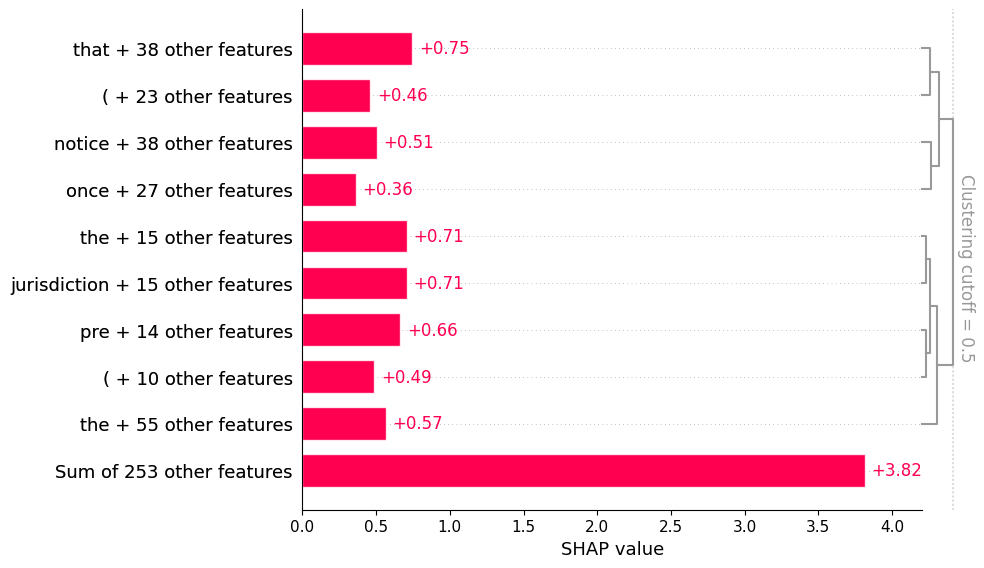

In [ ]:
shap.plots.bar(shap_values[1,:, "LABEL_0"])

In [ ]:
shap.plots.text(shap_values[3])

,,"Article 98 ( 1 ) A manifestation of intention may be made by means of public notice if the person making it is unable to ascertain who the other party is or is unable to ascertain the whereabouts thereof . ( 2 ) Public notice as referred to in the preceding paragraph is effected by a notice being posted in the posting area of the relevant court and an indication that that posting has been made being published in the Official Gazette at least once , in accordance with the provisions of the Code of Civil Procedure ( Act No . 109 of 1996 ) on service by publication ; provided , however , that if the court finds it to be suitable , it may order that a notice be posted in the posting area of the city office , ward office , town hall , or any facility equivalent to these in lieu of the relevant information being published in the Official Gazette .","( 3 ) A manifestation of intention by public notice is deemed to have reached the other party once two weeks have passed since the day when the relevant information was last published in the Official Gazette or once two weeks have passed since the day on which the relevant information started to be posted in lieu of being so published ; provided , however ,","that the effect of a manifestation of intention having reached the other party does not arise if the person making it was negligent in not ascertaining the other party or the whereabouts thereof . ( 4 ) If the person making a manifestation of intention is unable to ascertain who the other party is ,","the procedures involved in public notice are under the jurisdiction of the summary court that has jurisdiction over the locality where the person making the manifestation of intention is domiciled ; if the person making a manifestation of intention is unable to ascertain the whereabouts of the other party ,",the procedures involved in public notice are under the jurisdiction of the summary court that has jurisdiction over the locality of the last known domicile of the other party . ( 5 ) The court must have the person making a manifestation of intention prepay the expenses associated with a public notice .,[SEP],"In the event that a declaration of disappearance is rescinded , a person who has acquired property due to the declaration of disappearance must return to the missing person the full amount of the benefits received from the acquisition of the property ,",even if the person acted in good faith regarding the survival of the missing person .,[SEP] 59 [SEP] True [SEP] 48 [SEP],False [SEP] False
LABEL_0,0.0,-0.935,0.868,1.205,0.567,2.565,0.006,2.993,0.956,0.954,-0.158
LABEL_1,-0.0,0.935,-0.868,-1.205,-0.567,-2.565,-0.006,-2.993,-0.956,-0.954,0.158


# MISC

In [ ]:
def predict(model, data):
    with torch.no_grad():
        outputs = model(input_ids=data['input_ids'], attention_mask=data["attention_mask"])
        logits = outputs.logits
        print(outputs)
        predicted_class = torch.argmax(logits, dim=1).item()
        print(f"Predicted Class : {predicted_class}")

In [ ]:
predict(model, test_data[0])

In [ ]:
test_data[0]['label']

0

In [ ]:
outputs = model(input_ids=test_data[0]['input_ids'], attention_mask=test_data[0]["attention_mask"])


In [ ]:
outputs.logits.shape

torch.Size([1, 2])

In [ ]:
predicted_class = torch.argmax(outputs.logits, dim=1).item()
print(f"Predicted Class : {predicted_class}")


Predicted Class : 0


In [ ]:
[tokenizer.convert_ids_to_tokens([i])[0] for i in test_data[0]['input_ids'].squeeze().detach().numpy()]

In [ ]:
torch.softmax(outputs.logits, dim=1)[0][predicted_class].item()

0.7444248795509338

In [ ]:
test_data[0]['input_ids'].to(global_config.device).type(torch.Long).type()

AttributeError: ignored

In [ ]:
sample_text = "[CLS]"+test_data[0]['premise']+"[SEP]"+test_data[0]['hypothesis']+"[SEP]"
sample_text

"[CLS]Article 3\n(1) The enjoyment of private rights commences at birth.\n(2) Unless otherwise prohibited by applicable laws, regulations, or treaties, foreign nationals enjoy private rights..[SEP]An unborn child may not be given a gift on the donor's death.[SEP]"

In [ ]:
def summarize_attributions(attributions):
    attributions = attributions.sum(dim=-1).squeeze(0)
    attributions = attributions / torch.norm(attributions)
    return attributions

In [ ]:
# Use Captum for Interpretation
ig = IntegratedGradients(model)
additional_args = (test_data[0]["attention_mask"].to(global_config.device).type(torch.LongTensor),)
attributions, delta = ig.attribute(test_data[0]['input_ids'].to(torch.int64), additional_forward_args=additional_args, target=predicted_class, return_convergence_delta=True)
attributions_sum = summarize_attributions(attributions)
# Visualize the Attributions
attributions = attributions.squeeze().detach().numpy()
input_ids = test_data[0]['input_ids'].squeeze().detach().numpy()
tokenized_text = [tokenizer.convert_ids_to_tokens([i])[0] for i in test_data[0]['input_ids'].squeeze().detach().numpy()]

viz.visualize_text([viz.VisualizationDataRecord(
    attributions_sum,
    torch.softmax(outputs.logits, dim=1)[0][predicted_class].item(),
    predicted_class,
    test_data[0]['label'],
    sample_text,
    attributions.sum(),
    tokenized_text,
    delta[0].item()
)])

RuntimeError: ignored

In [ ]:
model.deberta.embeddings

DebertaV2Embeddings(
  (word_embeddings): Embedding(128100, 768, padding_idx=0)
  (LayerNorm): LayerNorm((768,), eps=1e-07, elementwise_affine=True)
  (dropout): StableDropout()
)